# Avacado Project

Problem Statement:
Avocado is a fruit consumed by people heavily in the United States. 

The task is to make a mode that can consider the data provided and predict the Average Price.

# Exploratory Data Analysis 

In [471]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [472]:
pd.set_option('display.max_rows',None)  #to visualize all variables.

In [473]:
ds=pd.read_csv('avacado project')
ds

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0.0,27-12-2015,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.00,conventional,2015.0,Albany
1,1.0,20-12-2015,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.00,conventional,2015.0,Albany
2,2.0,13-12-2015,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.00,conventional,2015.0,Albany
3,3.0,06-12-2015,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.00,conventional,2015.0,Albany
4,4.0,29-11-2015,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.00,conventional,2015.0,Albany
5,5.0,22-11-2015,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.00,conventional,2015.0,Albany
6,6.0,15-11-2015,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.00,conventional,2015.0,Albany
7,7.0,08-11-2015,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.00,conventional,2015.0,Albany
8,8.0,01-11-2015,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.00,conventional,2015.0,Albany
9,9.0,25-10-2015,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.00,conventional,2015.0,Albany


In [474]:
ds.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0.0,27-12-2015,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015.0,Albany
1,1.0,20-12-2015,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015.0,Albany
2,2.0,13-12-2015,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015.0,Albany
3,3.0,06-12-2015,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015.0,Albany
4,4.0,29-11-2015,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015.0,Albany


In [475]:
ds.info() # This will give Index, Datatype and Memory information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16468 entries, 0 to 16467
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    1517 non-null   float64
 1   Date          1517 non-null   object 
 2   AveragePrice  1517 non-null   float64
 3   Total Volume  1517 non-null   float64
 4   4046          1517 non-null   float64
 5   4225          1517 non-null   float64
 6   4770          1517 non-null   float64
 7   Total Bags    1517 non-null   float64
 8   Small Bags    1517 non-null   float64
 9   Large Bags    1517 non-null   float64
 10  XLarge Bags   1517 non-null   float64
 11  type          1517 non-null   object 
 12  year          1517 non-null   float64
 13  region        1517 non-null   object 
dtypes: float64(11), object(3)
memory usage: 1.8+ MB


In [476]:
ds.isnull().sum()

Unnamed: 0      14951
Date            14951
AveragePrice    14951
Total Volume    14951
4046            14951
4225            14951
4770            14951
Total Bags      14951
Small Bags      14951
Large Bags      14951
XLarge Bags     14951
type            14951
year            14951
region          14951
dtype: int64

In [477]:
df=ds.dropna(subset=['Unnamed: 0','Date','AveragePrice','4046','4225','4770','Total Bags','Small Bags','Large Bags','XLarge Bags','type','year','region',])

In [478]:
df

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0.0,27-12-2015,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.00,conventional,2015.0,Albany
1,1.0,20-12-2015,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.00,conventional,2015.0,Albany
2,2.0,13-12-2015,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.00,conventional,2015.0,Albany
3,3.0,06-12-2015,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.00,conventional,2015.0,Albany
4,4.0,29-11-2015,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.00,conventional,2015.0,Albany
5,5.0,22-11-2015,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.00,conventional,2015.0,Albany
6,6.0,15-11-2015,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.00,conventional,2015.0,Albany
7,7.0,08-11-2015,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.00,conventional,2015.0,Albany
8,8.0,01-11-2015,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.00,conventional,2015.0,Albany
9,9.0,25-10-2015,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.00,conventional,2015.0,Albany


In [479]:
df.isnull().sum()   # Will show you null count for each column.

Unnamed: 0      0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

# Graphical Representation

In [480]:
import matplotlib.pyplot as plt
import seaborn as sns

In [481]:
df.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

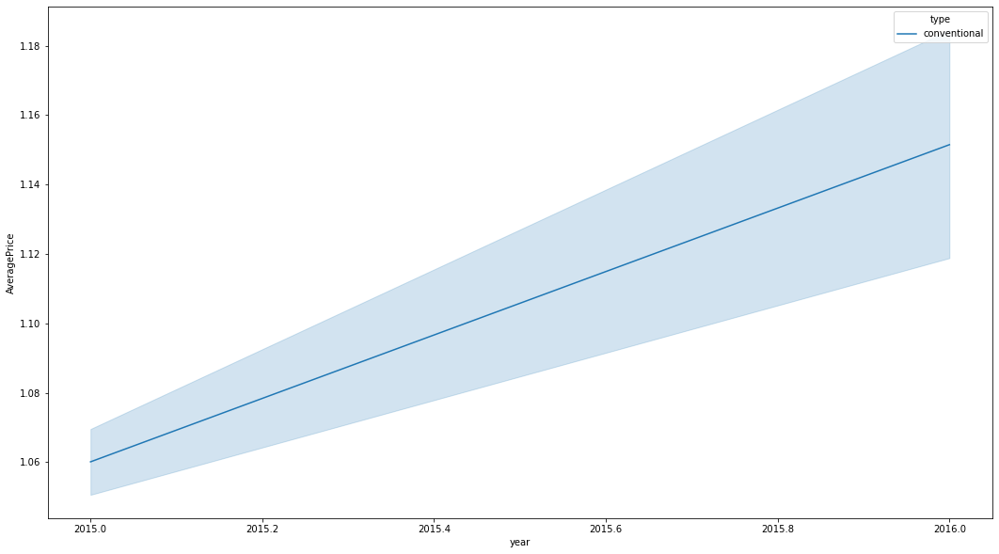

In [482]:
#plot Lineplot
plt.figure(figsize=(18,10))
sns.lineplot(x='year', y='AveragePrice', hue='type', data=df)
plt.show()

The average price is increasing frequently throughout the year.

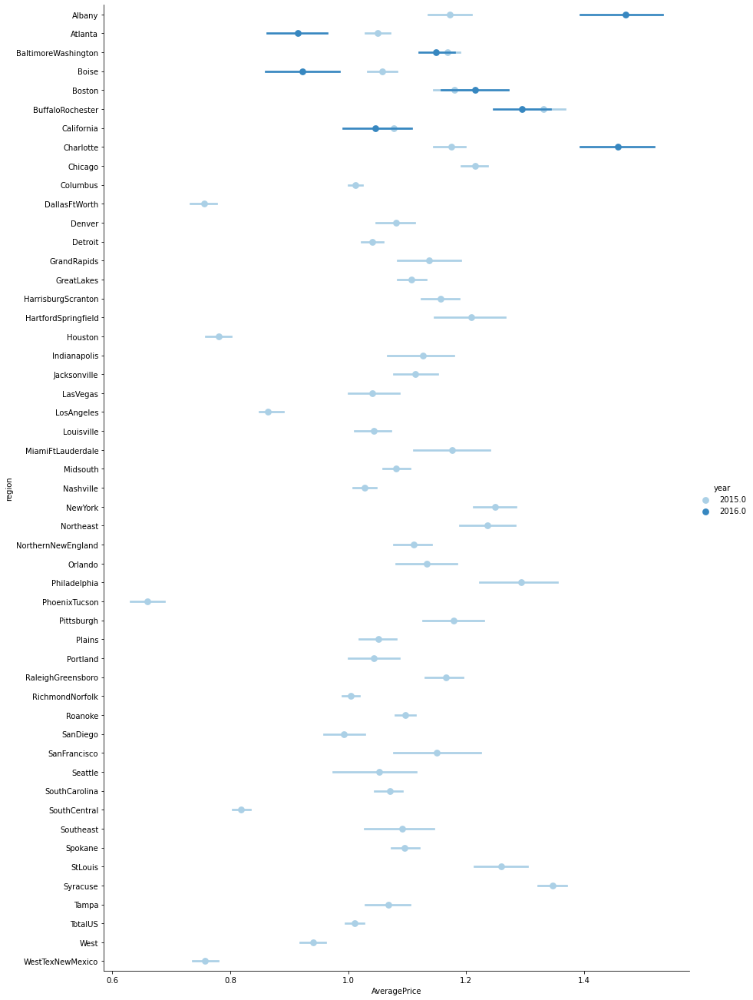

In [483]:
#plot factorplot
sns.factorplot('AveragePrice','region',data=df,hue='year',size=18,aspect=0.7,palette='Blues',join=False)

Just by Observing graph, the average price is high on Albany & Charlotte region on year 2016.

Text(0.5, 1.0, 'Average Price')

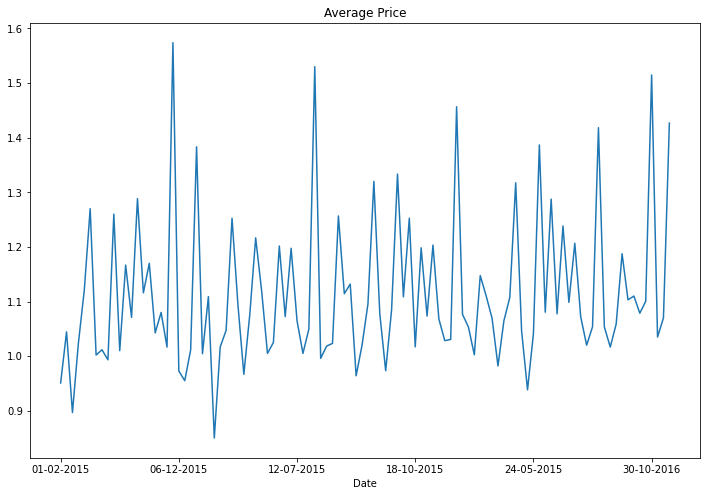

In [484]:
date=df.groupby('Date').mean()
plt.figure(figsize=(12,8))
date['AveragePrice'].plot()
plt.title('Average Price')

The Average price is high on June month of 2015, then average price is increasing frequently on every five month onwards.

<AxesSubplot:xlabel='AveragePrice', ylabel='Density'>

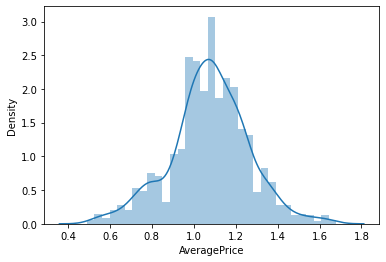

In [485]:
sns.distplot(df['AveragePrice'],kde=True)

Just by Observing above graph, the Average price distribution of avacado price is lies between 0.95 to 1.1.

Conclusion of Graphical Representation

The columns that are going to drop are type,region, unnamed and date.

In [486]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1517 entries, 0 to 1516
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    1517 non-null   float64
 1   Date          1517 non-null   object 
 2   AveragePrice  1517 non-null   float64
 3   Total Volume  1517 non-null   float64
 4   4046          1517 non-null   float64
 5   4225          1517 non-null   float64
 6   4770          1517 non-null   float64
 7   Total Bags    1517 non-null   float64
 8   Small Bags    1517 non-null   float64
 9   Large Bags    1517 non-null   float64
 10  XLarge Bags   1517 non-null   float64
 11  type          1517 non-null   object 
 12  year          1517 non-null   float64
 13  region        1517 non-null   object 
dtypes: float64(11), object(3)
memory usage: 217.8+ KB


In [487]:
df.drop(['Unnamed: 0','Date','type','region'],axis=1,inplace=True)

In [488]:
df.dtypes

AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
year            float64
dtype: object

In [489]:
df.columns   # This will print the names of all columns.

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'year'],
      dtype='object')

In [490]:
df.describe()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
count,1517.000000,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1517.000000,1517.000000
mean,1.074990,1.601879e+06,6.464387e+05,6.114375e+05,5.040550e+04,2.935974e+05,2.487736e+05,4.264205e+04,2181.771074,2015.162821
std,0.188891,4.433143e+06,1.947614e+06,1.672906e+06,1.377812e+05,7.579765e+05,6.474765e+05,1.182157e+05,7455.712144,0.369324
min,0.490000,3.875074e+04,4.677200e+02,1.783770e+03,0.000000e+00,3.311770e+03,3.311770e+03,0.000000e+00,0.000000,2015.000000
25%,0.980000,1.474700e+05,2.040034e+04,4.147606e+04,9.112500e+02,3.620689e+04,2.972722e+04,5.407400e+02,0.000000,2015.000000
50%,1.080000,4.027919e+05,8.175117e+04,1.186649e+05,7.688170e+03,7.397906e+04,6.237569e+04,5.044350e+03,0.000000,2015.000000
75%,1.190000,9.819751e+05,3.775785e+05,4.851503e+05,2.916730e+04,1.576097e+05,1.461994e+05,2.926767e+04,401.480000,2015.000000
max,1.680000,4.465546e+07,1.893304e+07,1.895648e+07,1.381516e+06,6.736304e+06,5.893642e+06,1.121076e+06,108072.790000,2016.000000


<AxesSubplot:>

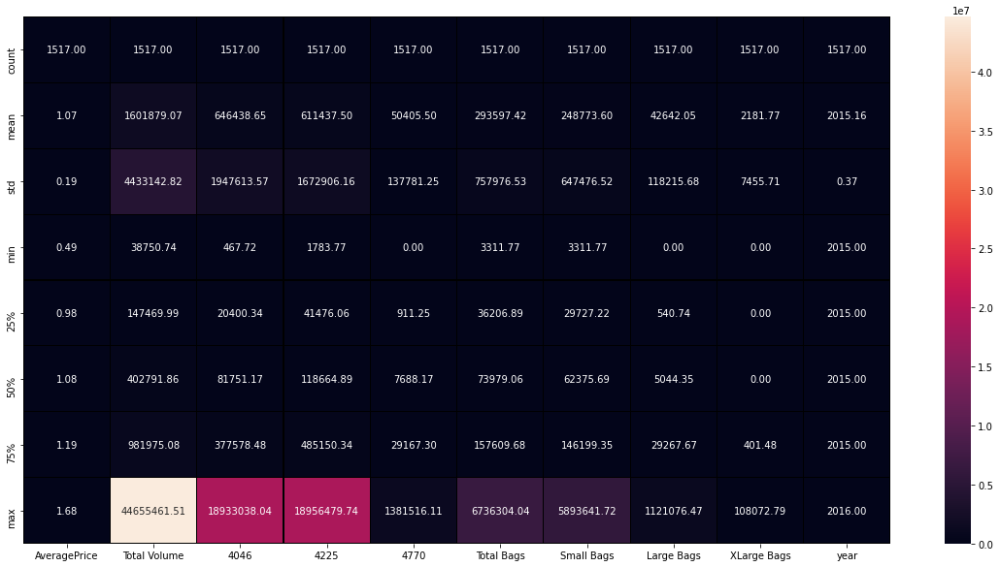

In [491]:
plt.figure(figsize=(20,10))
sns.heatmap(df.describe(),annot=True,linewidths=0.1,linecolor='black',fmt='0.2f')

In [492]:
dfcor=df.corr()
dfcor

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
AveragePrice,1.000000,-0.140470,-0.190096,-0.092084,-0.100567,-0.111597,-0.097682,-0.177480,-0.048284,0.178683
Total Volume,-0.140470,1.000000,0.985568,0.987154,0.934347,0.967689,0.960642,0.910226,0.521717,-0.004189
4046,-0.190096,0.985568,1.000000,0.951952,0.898570,0.930395,0.922278,0.884229,0.474063,-0.040439
4225,-0.092084,0.987154,0.951952,1.000000,0.927757,0.951779,0.943988,0.900496,0.504718,-0.007254
4770,-0.100567,0.934347,0.898570,0.927757,1.000000,0.926405,0.923607,0.840523,0.646053,0.029222
Total Bags,-0.111597,0.967689,0.930395,0.951779,0.926405,1.000000,0.997341,0.911336,0.601856,0.090108
Small Bags,-0.097682,0.960642,0.922278,0.943988,0.923607,0.997341,1.000000,0.879131,0.611300,0.106382
Large Bags,-0.177480,0.910226,0.884229,0.900496,0.840523,0.911336,0.879131,1.000000,0.447779,-0.018678
XLarge Bags,-0.048284,0.521717,0.474063,0.504718,0.646053,0.601856,0.611300,0.447779,1.000000,0.218342
year,0.178683,-0.004189,-0.040439,-0.007254,0.029222,0.090108,0.106382,-0.018678,0.218342,1.000000


<AxesSubplot:>

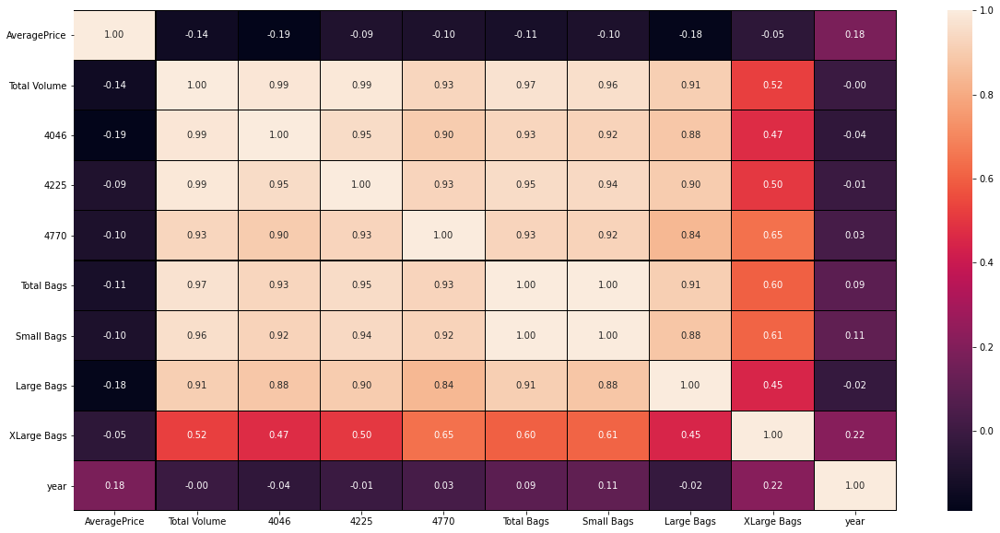

In [493]:
plt.figure(figsize=(20,10))
sns.heatmap(dfcor,annot=True,linewidths=0.1,linecolor='black',fmt='0.2f')

In [494]:
df.skew()

AveragePrice   -0.109444
Total Volume    6.200138
4046            6.051830
4225            6.394926
4770            5.405164
Total Bags      5.366378
Small Bags      5.355185
Large Bags      5.144495
XLarge Bags     5.775077
year            1.828332
dtype: float64

To Check Outliers

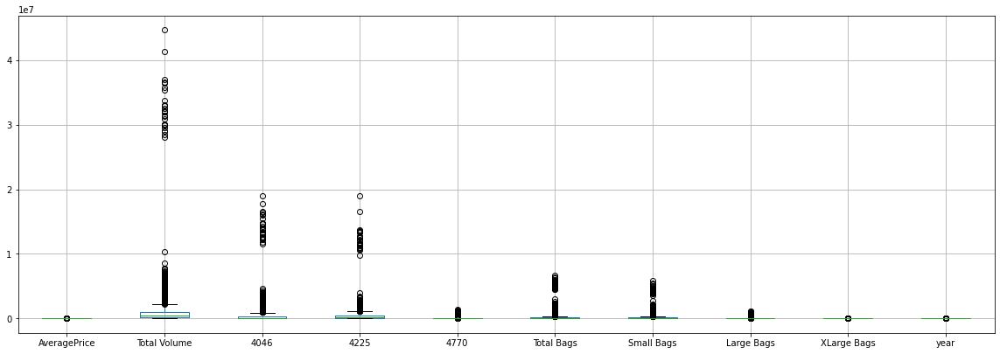

In [495]:
df.boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

In [496]:
from scipy.stats import zscore
z=np.abs(zscore(df))
z

array([[1.35048079, 0.34696593, 0.33149016, ..., 0.36004386, 0.29272731,
        0.44100815],
       [1.45639674, 0.34907791, 0.33167633, ..., 0.36000798, 0.29272731,
        0.44100815],
       [0.76783831, 0.33478463, 0.33161448, ..., 0.35996017, 0.29272731,
        0.44100815],
       ...,
       [2.14485045, 0.32120275, 0.30820887, ..., 0.29095317, 0.1820374 ,
        2.26753179],
       [2.09189247, 0.31878364, 0.30423037, ..., 0.29078309, 0.29272731,
        2.26753179],
       [1.88006056, 0.3201721 , 0.30987728, ..., 0.26226571, 0.29272731,
        2.26753179]])

In [497]:
threshold=3
print(np.where(z>3))

(array([ 398,  401,  409,  412,  412,  760, 1016, 1017, 1059, 1182, 1182,
       1182, 1182, 1182, 1182, 1182, 1182, 1183, 1183, 1183, 1183, 1183,
       1183, 1183, 1184, 1184, 1184, 1184, 1184, 1184, 1184, 1184, 1185,
       1185, 1185, 1185, 1185, 1185, 1185, 1186, 1186, 1186, 1186, 1186,
       1186, 1186, 1187, 1187, 1187, 1187, 1187, 1187, 1187, 1187, 1188,
       1188, 1188, 1188, 1188, 1188, 1188, 1189, 1189, 1189, 1189, 1189,
       1189, 1189, 1189, 1190, 1190, 1190, 1190, 1190, 1190, 1190, 1190,
       1191, 1191, 1191, 1191, 1191, 1191, 1191, 1191, 1192, 1192, 1192,
       1192, 1192, 1192, 1192, 1193, 1193, 1193, 1193, 1193, 1193, 1193,
       1194, 1194, 1194, 1194, 1194, 1194, 1194, 1195, 1195, 1195, 1195,
       1195, 1195, 1195, 1195, 1196, 1196, 1196, 1196, 1196, 1196, 1196,
       1197, 1197, 1197, 1197, 1197, 1197, 1197, 1198, 1198, 1198, 1198,
       1198, 1198, 1198, 1198, 1199, 1199, 1199, 1199, 1199, 1199, 1199,
       1200, 1200, 1200, 1200, 1200, 1200, 1200, 1

In [498]:
df_new=df[(z<3).all(axis=1)]
df_new

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.00,2015.0
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.00,2015.0
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.00,2015.0
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.00,2015.0
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.00,2015.0
5,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.00,2015.0
6,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.00,2015.0
7,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.00,2015.0
8,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.00,2015.0
9,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.00,2015.0


In [499]:
df.shape

(1517, 10)

In [500]:
df_new.shape

(1436, 10)

In [501]:
Data_loss=((1517-1436)/1517*100)
Data_loss

5.339485827290705

In [502]:
x= df.drop('AveragePrice',axis=1)
y= df['AveragePrice']

Skewness Handling

In [503]:
x.skew()

Total Volume    6.200138
4046            6.051830
4225            6.394926
4770            5.405164
Total Bags      5.366378
Small Bags      5.355185
Large Bags      5.144495
XLarge Bags     5.775077
year            1.828332
dtype: float64

In [504]:
from sklearn.preprocessing import power_transform
df_new=power_transform(x)

df_new=pd.DataFrame(df_new,columns=x.columns)

The power transform fuction is used to reduce the skewness.

In [505]:
df_new.skew()

Total Volume    0.000000
4046           -0.012059
4225            0.008450
4770           -0.032945
Total Bags      0.005205
Small Bags      0.027632
Large Bags     -0.074795
XLarge Bags     0.417289
year            0.000000
dtype: float64

In [506]:
x=df_new
x

,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
0,0.0,-1.757736,-0.545363,-1.675878,-2.030217,-1.847586,-1.072172,-0.885019,0.0
1,0.0,-1.919557,-0.667814,-1.619934,-1.931468,-1.748426,-1.062461,-0.885019,0.0
2,0.0,-1.857996,-0.124940,-1.375858,-2.103934,-1.923541,-1.050081,-0.885019,0.0
3,0.0,-1.724410,-0.375219,-1.555093,-2.497084,-2.330946,-0.991861,-0.885019,0.0
4,0.0,-1.794175,-0.679011,-1.542167,-2.422996,-2.267260,-0.900922,-0.885019,0.0
5,0.0,-1.707263,-0.622099,-1.704522,-2.331445,-2.159322,-1.002838,-0.885019,0.0
6,0.0,-1.652065,-0.361102,-1.479416,-2.080129,-1.902012,-1.012586,-0.885019,0.0
7,0.0,-1.903560,-0.166447,-1.525874,-2.306331,-2.212691,-0.636264,-0.885019,0.0
8,0.0,-1.763101,-0.258552,-1.506363,-1.735278,-1.568802,-0.812946,-0.885019,0.0
9,0.0,-1.836083,-0.439446,-1.420535,-2.039389,-1.920833,-0.635272,-0.885019,0.0


Linear Regression Model

In [507]:
from sklearn.preprocessing import MinMaxScaler
mms=MinMaxScaler()
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split

In [508]:
for i in range(0,300):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.7,random_state=i)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    print(f'At random state {i},the training accuracy is:{r2_score(y_train,pred_train)}')
    print(f'At random state {i},the testing accuracy is:{r2_score(y_test,pred_test)}')
    print('\n')

At random state 0,the training accuracy is:0.3835042642334532
At random state 0,the testing accuracy is:0.3006997817219298


At random state 1,the training accuracy is:0.32356477077791235
At random state 1,the testing accuracy is:0.3230151724394278


At random state 2,the training accuracy is:0.29341260026133775
At random state 2,the testing accuracy is:0.31500770482920426


At random state 3,the training accuracy is:0.3513955523870459
At random state 3,the testing accuracy is:0.3085750876797093


At random state 4,the training accuracy is:0.35691790773918075
At random state 4,the testing accuracy is:0.30978744126947366


At random state 5,the training accuracy is:0.30127050884354567
At random state 5,the testing accuracy is:0.33261207708602436


At random state 6,the training accuracy is:0.31341132452927445
At random state 6,the testing accuracy is:0.3214511993177951


At random state 7,the training accuracy is:0.3799339567940456
At random state 7,the testing accuracy is:0.29650679196

At random state 68,the testing accuracy is:0.3358366521194016


At random state 69,the training accuracy is:0.3715318825575923
At random state 69,the testing accuracy is:0.29476529984520194


At random state 70,the training accuracy is:0.3277964345212352
At random state 70,the testing accuracy is:0.318638319350004


At random state 71,the training accuracy is:0.3705253876112463
At random state 71,the testing accuracy is:0.29234733385882783


At random state 72,the training accuracy is:0.33888038161074807
At random state 72,the testing accuracy is:0.31508075878361474


At random state 73,the training accuracy is:0.32915540664274756
At random state 73,the testing accuracy is:0.3244154156186172


At random state 74,the training accuracy is:0.33726689640221397
At random state 74,the testing accuracy is:0.3200447759297398


At random state 75,the training accuracy is:0.3017024280858508
At random state 75,the testing accuracy is:0.3356555042718199


At random state 76,the training accuracy i

At random state 140,the training accuracy is:0.39073221216790066
At random state 140,the testing accuracy is:0.2807875775019627


At random state 141,the training accuracy is:0.3934171389192834
At random state 141,the testing accuracy is:0.2915627338959089


At random state 142,the training accuracy is:0.31168073912868155
At random state 142,the testing accuracy is:0.33036394909577127


At random state 143,the training accuracy is:0.3775427940966227
At random state 143,the testing accuracy is:0.2996844663952566


At random state 144,the training accuracy is:0.31297127616176434
At random state 144,the testing accuracy is:0.3314692017659394


At random state 145,the training accuracy is:0.39698382748949157
At random state 145,the testing accuracy is:0.28094184498590735


At random state 146,the training accuracy is:0.28017518222128335
At random state 146,the testing accuracy is:0.3358242775158653


At random state 147,the training accuracy is:0.369610784734813
At random state 147,the tes

At random state 210,the training accuracy is:0.3298632533203538
At random state 210,the testing accuracy is:0.31530484564652284


At random state 211,the training accuracy is:0.32648898145035343
At random state 211,the testing accuracy is:0.31166489328244706


At random state 212,the training accuracy is:0.3216981680081762
At random state 212,the testing accuracy is:0.32000605143304606


At random state 213,the training accuracy is:0.33534431533868303
At random state 213,the testing accuracy is:0.3149540424860716


At random state 214,the training accuracy is:0.3146188576708865
At random state 214,the testing accuracy is:0.3266547419921977


At random state 215,the training accuracy is:0.4194607368865545
At random state 215,the testing accuracy is:0.2727491209066034


At random state 216,the training accuracy is:0.37976049639766396
At random state 216,the testing accuracy is:0.28629131175016764


At random state 217,the training accuracy is:0.37169093724343494
At random state 217,the t

At random state 274,the training accuracy is:0.3382157733930313
At random state 274,the testing accuracy is:0.3129541065005973


At random state 275,the training accuracy is:0.34309318256794397
At random state 275,the testing accuracy is:0.31199816281097625


At random state 276,the training accuracy is:0.37582191357495365
At random state 276,the testing accuracy is:0.2822833523883951


At random state 277,the training accuracy is:0.4206352965447002
At random state 277,the testing accuracy is:0.28671740612349483


At random state 278,the training accuracy is:0.3734537429436401
At random state 278,the testing accuracy is:0.2987508410537154


At random state 279,the training accuracy is:0.34606202014935106
At random state 279,the testing accuracy is:0.31921274218426343


At random state 280,the training accuracy is:0.3183261304825695
At random state 280,the testing accuracy is:0.3232886842487085


At random state 281,the training accuracy is:0.3109342317840603
At random state 281,the tes

In [509]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.7,random_state=1)
lr.fit(x_train,y_train)

LinearRegression()

In [510]:
# predict the value
pred=lr.predict(x_test)
print("predicted ",pred)
print("actual ",y_test)

predicted  [1.0034644  1.05781916 1.06682702 ... 0.97964189 0.9985153  0.94933575]
actual  503     1.25
368     1.11
1071    1.08
1027    0.83
1322    1.17
1470    1.17
1233    1.03
119     1.09
490     1.14
547     1.04
1256    0.76
961     1.02
736     0.99
682     1.45
264     1.03
1117    1.34
777     0.74
813     1.22
581     1.25
111     1.16
101     0.99
1201    0.95
403     1.05
825     1.11
60      0.99
900     1.00
913     1.05
991     1.14
661     1.10
102     1.24
899     0.95
941     1.11
868     1.18
653     1.26
321     1.19
190     1.13
107     1.18
75      0.97
1158    1.11
1021    0.80
1483    0.79
37      1.13
201     0.93
823     0.96
1148    0.97
984     1.15
1206    0.95
268     1.05
674     1.22
1103    1.12
1297    0.97
898     0.94
1443    1.29
1181    1.21
285     1.09
1257    0.74
169     1.04
1334    1.09
292     1.05
428     1.22
1032    0.86
711     1.17
654     1.16
259     0.93
80      1.10
248     1.03
1264    0.72
1225    1.04
623     1.07
194     1.10

In [511]:
print("error:")
print("Mean absolute error:",mean_absolute_error(y_test,pred))
print("Mean squared error:",mean_squared_error(y_test,pred))
print("Root mean squared error:",np.sqrt(mean_squared_error(y_test,pred)))

error:
Mean absolute error: 0.11856970078656098
Mean squared error: 0.023163466876245417
Root mean squared error: 0.1521954890141144


The Root mean squared error value is low so we can say this is an good model but we should compare with another model.


In [512]:
predict_test=lr.predict(x_test)
print(r2_score(y_test,predict_test)*100)

32.301517243942776


In [513]:
predict_train=lr.predict(x_train)
print(r2_score(y_train,predict_train)*100)

32.35647707779123


In [514]:
Train_accuracy=r2_score(y_train,predict_train)
Test_accuracy=r2_score(y_test,predict_test)

from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lr,x,y,cv=j)
    cv_mean=cv_score.mean()
    print(f'At cross fold(j) the cv score is {cv_mean} and accuracy score for training is {Train_accuracy} and accuracy score  for the {Test_accuracy}')
    print('\n')

At cross fold(j) the cv score is -0.08639267693304259 and accuracy score for training is 0.32356477077791235 and accuracy score  for the 0.3230151724394278


At cross fold(j) the cv score is 0.12748198497654803 and accuracy score for training is 0.32356477077791235 and accuracy score  for the 0.3230151724394278


At cross fold(j) the cv score is 0.09088585599496693 and accuracy score for training is 0.32356477077791235 and accuracy score  for the 0.3230151724394278


At cross fold(j) the cv score is 0.13208925934192078 and accuracy score for training is 0.32356477077791235 and accuracy score  for the 0.3230151724394278


At cross fold(j) the cv score is 0.005579838906528485 and accuracy score for training is 0.32356477077791235 and accuracy score  for the 0.3230151724394278


At cross fold(j) the cv score is 0.08655271140157547 and accuracy score for training is 0.32356477077791235 and accuracy score  for the 0.3230151724394278


At cross fold(j) the cv score is 0.060526331106378964 an

Lets plot with y_test vs prediction

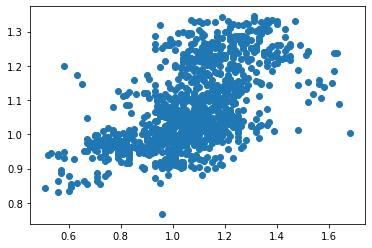

In [515]:
plt.scatter(x=y_test,y=predict_test)

Decision Tree Regressor Model

In [516]:
from sklearn.preprocessing import MinMaxScaler
mms=MinMaxScaler()
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor()
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split

In [517]:
for i in range(0,300):
    x1_train,x1_test,y1_train,y1_test=train_test_split(x,y,test_size=0.7,random_state=i)
    dtr.fit(x1_train,y1_train)
    pred_train=dtr.predict(x1_train)
    pred_test=dtr.predict(x1_test)
    print(f'At random state {i},the training accuracy is:{r2_score(y1_train,pred_train)}')
    print(f'At random state {i},the testing accuracy is:{r2_score(y1_test,pred_test)}')
    print('\n')

At random state 0,the training accuracy is:1.0
At random state 0,the testing accuracy is:0.3548393115082231


At random state 1,the training accuracy is:1.0
At random state 1,the testing accuracy is:0.44820990663088134


At random state 2,the training accuracy is:1.0
At random state 2,the testing accuracy is:0.44337520773198513


At random state 3,the training accuracy is:1.0
At random state 3,the testing accuracy is:0.43654654772075063


At random state 4,the training accuracy is:1.0
At random state 4,the testing accuracy is:0.3491738582935815


At random state 5,the training accuracy is:1.0
At random state 5,the testing accuracy is:0.47586286266295885


At random state 6,the training accuracy is:1.0
At random state 6,the testing accuracy is:0.5169018194787399


At random state 7,the training accuracy is:1.0
At random state 7,the testing accuracy is:0.3309614317066092


At random state 8,the training accuracy is:1.0
At random state 8,the testing accuracy is:0.5237023640735532


At ran

At random state 77,the training accuracy is:1.0
At random state 77,the testing accuracy is:0.3706829704708483


At random state 78,the training accuracy is:1.0
At random state 78,the testing accuracy is:0.44069305966233463


At random state 79,the training accuracy is:1.0
At random state 79,the testing accuracy is:0.4045891221160056


At random state 80,the training accuracy is:1.0
At random state 80,the testing accuracy is:0.262546590658043


At random state 81,the training accuracy is:1.0
At random state 81,the testing accuracy is:0.4390998741487738


At random state 82,the training accuracy is:1.0
At random state 82,the testing accuracy is:0.441967523613112


At random state 83,the training accuracy is:1.0
At random state 83,the testing accuracy is:0.45218046177248594


At random state 84,the training accuracy is:1.0
At random state 84,the testing accuracy is:0.47985409497448694


At random state 85,the training accuracy is:1.0
At random state 85,the testing accuracy is:0.3452957231

At random state 152,the training accuracy is:1.0
At random state 152,the testing accuracy is:0.3602632683745589


At random state 153,the training accuracy is:1.0
At random state 153,the testing accuracy is:0.5275455898124641


At random state 154,the training accuracy is:1.0
At random state 154,the testing accuracy is:0.27464352015053095


At random state 155,the training accuracy is:1.0
At random state 155,the testing accuracy is:0.4707903059000822


At random state 156,the training accuracy is:1.0
At random state 156,the testing accuracy is:0.49753224627960113


At random state 157,the training accuracy is:1.0
At random state 157,the testing accuracy is:0.46749079874067034


At random state 158,the training accuracy is:1.0
At random state 158,the testing accuracy is:0.5533359815878006


At random state 159,the training accuracy is:1.0
At random state 159,the testing accuracy is:0.4042288811896496


At random state 160,the training accuracy is:1.0
At random state 160,the testing accu

At random state 244,the training accuracy is:1.0
At random state 244,the testing accuracy is:0.39731969226239827


At random state 245,the training accuracy is:1.0
At random state 245,the testing accuracy is:0.48384048937976576


At random state 246,the training accuracy is:1.0
At random state 246,the testing accuracy is:0.44222586720713053


At random state 247,the training accuracy is:1.0
At random state 247,the testing accuracy is:0.26795427555278006


At random state 248,the training accuracy is:1.0
At random state 248,the testing accuracy is:0.478597686495863


At random state 249,the training accuracy is:1.0
At random state 249,the testing accuracy is:0.2658629513886479


At random state 250,the training accuracy is:1.0
At random state 250,the testing accuracy is:0.3941654336615753


At random state 251,the training accuracy is:1.0
At random state 251,the testing accuracy is:0.4416694444713709


At random state 252,the training accuracy is:1.0
At random state 252,the testing accu

In [518]:
x1_train,x1_test,y1_train,y1_test=train_test_split(x,y,test_size=0.7,random_state=8)
dtr.fit(x1_train,y1_train)

DecisionTreeRegressor()

In [519]:
# predict the value
pred=dtr.predict(x1_test)
print("predicted ",pred)
print("actual ",y1_test)

predicted  [1.23 1.44 0.9  ... 1.04 1.08 1.04]
actual  652     1.28
682     1.45
469     0.77
355     1.07
807     0.56
145     1.03
1340    1.01
1273    1.48
740     1.27
1021    0.80
933     0.91
51      1.22
1415    1.40
431     1.17
623     1.07
1068    1.17
1082    1.08
117     1.15
1492    0.92
1451    0.95
1486    0.93
1371    1.62
1440    1.36
141     1.06
724     1.18
503     1.25
195     1.07
414     1.15
892     0.98
746     0.95
909     1.06
456     0.62
433     1.26
353     1.11
131     1.10
519     1.16
1385    1.26
1280    1.40
75      0.97
920     1.08
970     1.30
517     1.22
670     1.32
693     1.27
854     1.06
518     0.95
350     1.03
546     0.85
733     0.98
618     0.96
1379    1.56
908     0.98
1438    1.14
307     0.67
826     1.19
274     0.99
512     1.25
299     0.77
243     1.27
1027    0.83
412     1.02
1176    1.17
283     1.00
1028    0.84
729     1.26
103     1.28
461     0.76
122     1.18
444     1.20
1372    1.41
1123    1.36
1157    1.12
1447    1

In [520]:
print("error:")
print("Mean absolute error:",mean_absolute_error(y1_test,pred))
print("Mean squared error:",mean_squared_error(y1_test,pred))
print("Root mean squared error:",np.sqrt(mean_squared_error(y1_test,pred)))

error:
Mean absolute error: 0.08941619585687381
Mean squared error: 0.01627514124293785
Root mean squared error: 0.12757406179524838


In Decision Tree Classifier model, The Root mean squared error value is low when compared with Linear Rgression model so we can say this is an good model but we should compare with one more model.

In [521]:
predict_test=dtr.predict(x1_test)
print(r2_score(y1_test,predict_test)*100)

54.87574696813788


In [522]:
predict_train=dtr.predict(x1_train)
print(r2_score(y1_train,predict_train)*100)

100.0


In [523]:
Train_accuracy=r2_score(y1_train,predict_train)
Test_accuracy=r2_score(y1_test,predict_test)

from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(dtr,x,y,cv=j)
    cv_mean=cv_score.mean()
    print(f'At cross fold(j) the cv score is {cv_mean} and accuracy score for training is {Train_accuracy} and accuracy score  for the {Test_accuracy}')
    print('\n')

At cross fold(j) the cv score is -0.3584221844995259 and accuracy score for training is 1.0 and accuracy score  for the 0.5487574696813788


At cross fold(j) the cv score is -0.5229800203666417 and accuracy score for training is 1.0 and accuracy score  for the 0.5487574696813788


At cross fold(j) the cv score is -0.7219843776291358 and accuracy score for training is 1.0 and accuracy score  for the 0.5487574696813788


At cross fold(j) the cv score is -0.5381521705094628 and accuracy score for training is 1.0 and accuracy score  for the 0.5487574696813788


At cross fold(j) the cv score is -0.6625349944594455 and accuracy score for training is 1.0 and accuracy score  for the 0.5487574696813788


At cross fold(j) the cv score is -0.44869871897964736 and accuracy score for training is 1.0 and accuracy score  for the 0.5487574696813788


At cross fold(j) the cv score is -0.4261577941460953 and accuracy score for training is 1.0 and accuracy score  for the 0.5487574696813788


At cross fol

Lets plot with y_test vs prediction

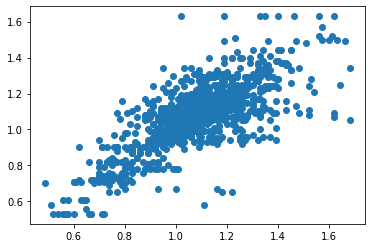

In [524]:
plt.scatter(x=y1_test,y=predict_test)

Random Forest Regressor Model

In [525]:
from sklearn.preprocessing import MinMaxScaler
mms=MinMaxScaler()
from sklearn.ensemble import RandomForestRegressor
rdr=RandomForestRegressor()
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split

In [526]:
for i in range(0,300):
    x2_train,x2_test,y2_train,y2_test=train_test_split(x,y,test_size=0.7,random_state=i)
    rdr.fit(x2_train,y2_train)
    pred_train=rdr.predict(x2_train)
    pred_test=rdr.predict(x2_test)
    print(f'At random state {i},the training accuracy is:{r2_score(y2_train,pred_train)}')
    print(f'At random state {i},the testing accuracy is:{r2_score(y2_test,pred_test)}')
    print('\n')

At random state 0,the training accuracy is:0.9543159925050119
At random state 0,the testing accuracy is:0.6717214693088208


At random state 1,the training accuracy is:0.9507192851786296
At random state 1,the testing accuracy is:0.7180187501960522


At random state 2,the training accuracy is:0.9515479208593147
At random state 2,the testing accuracy is:0.6849480561409136


At random state 3,the training accuracy is:0.954527627517503
At random state 3,the testing accuracy is:0.6727573965891636


At random state 4,the training accuracy is:0.9517174660881416
At random state 4,the testing accuracy is:0.6829749195590811


At random state 5,the training accuracy is:0.9561399173247584
At random state 5,the testing accuracy is:0.7175008242604771


At random state 6,the training accuracy is:0.9502157308558012
At random state 6,the testing accuracy is:0.6698911178188389


At random state 7,the training accuracy is:0.956439603636584
At random state 7,the testing accuracy is:0.6533213478185035


At

At random state 65,the training accuracy is:0.9568992582840004
At random state 65,the testing accuracy is:0.6699677955968621


At random state 66,the training accuracy is:0.9553318241473825
At random state 66,the testing accuracy is:0.6630451539684683


At random state 67,the training accuracy is:0.9564957381591497
At random state 67,the testing accuracy is:0.651830856910073


At random state 68,the training accuracy is:0.9471916738539196
At random state 68,the testing accuracy is:0.671691607798378


At random state 69,the training accuracy is:0.9581163134921166
At random state 69,the testing accuracy is:0.668906461810997


At random state 70,the training accuracy is:0.9509218316926225
At random state 70,the testing accuracy is:0.6282178820822096


At random state 71,the training accuracy is:0.9559056641353447
At random state 71,the testing accuracy is:0.6415407212831561


At random state 72,the training accuracy is:0.9513616216927165
At random state 72,the testing accuracy is:0.647147

At random state 130,the training accuracy is:0.9566019403507426
At random state 130,the testing accuracy is:0.7078463749180658


At random state 131,the training accuracy is:0.9543435795529832
At random state 131,the testing accuracy is:0.6585532339440834


At random state 132,the training accuracy is:0.9541155994584786
At random state 132,the testing accuracy is:0.6511768319409645


At random state 133,the training accuracy is:0.955014520396232
At random state 133,the testing accuracy is:0.671601535723817


At random state 134,the training accuracy is:0.9585362568401438
At random state 134,the testing accuracy is:0.6865111679976936


At random state 135,the training accuracy is:0.9493377551515022
At random state 135,the testing accuracy is:0.6742062215736883


At random state 136,the training accuracy is:0.9587605273736075
At random state 136,the testing accuracy is:0.7001658090950996


At random state 137,the training accuracy is:0.9591474248725883
At random state 137,the testing acc

At random state 194,the training accuracy is:0.9603740724670293
At random state 194,the testing accuracy is:0.6683435937931685


At random state 195,the training accuracy is:0.95859483087098
At random state 195,the testing accuracy is:0.6532522896581858


At random state 196,the training accuracy is:0.9476004408418298
At random state 196,the testing accuracy is:0.6718235930731673


At random state 197,the training accuracy is:0.9568944752643695
At random state 197,the testing accuracy is:0.6885228615400756


At random state 198,the training accuracy is:0.9494132850719963
At random state 198,the testing accuracy is:0.6877966992074482


At random state 199,the training accuracy is:0.9556364908840937
At random state 199,the testing accuracy is:0.6444505414434731


At random state 200,the training accuracy is:0.9525565156238411
At random state 200,the testing accuracy is:0.6800944159954831


At random state 201,the training accuracy is:0.9514860251613303
At random state 201,the testing acc

At random state 258,the training accuracy is:0.9487558752963695
At random state 258,the testing accuracy is:0.717112203134259


At random state 259,the training accuracy is:0.9539970308878054
At random state 259,the testing accuracy is:0.6525031591343424


At random state 260,the training accuracy is:0.9629066388528347
At random state 260,the testing accuracy is:0.6029644209001781


At random state 261,the training accuracy is:0.9622888617497015
At random state 261,the testing accuracy is:0.6519837046788539


At random state 262,the training accuracy is:0.9535716625922881
At random state 262,the testing accuracy is:0.6686664170620502


At random state 263,the training accuracy is:0.952723910664249
At random state 263,the testing accuracy is:0.6937883346579222


At random state 264,the training accuracy is:0.9544066859471716
At random state 264,the testing accuracy is:0.6780426217818604


At random state 265,the training accuracy is:0.955259427172225
At random state 265,the testing accu

In [527]:
x2_train,x2_test,y2_train,y2_test=train_test_split(x,y,test_size=0.7,random_state=1)
rdr.fit(x2_train,y2_train)

RandomForestRegressor()

In [528]:
# predict the value
pred=rdr.predict(x2_test)
print("predicted ",pred)
print("actual ",y2_test)

predicted  [1.1831 1.0513 1.0682 ... 0.9478 1.073  0.9088]
actual  503     1.25
368     1.11
1071    1.08
1027    0.83
1322    1.17
1470    1.17
1233    1.03
119     1.09
490     1.14
547     1.04
1256    0.76
961     1.02
736     0.99
682     1.45
264     1.03
1117    1.34
777     0.74
813     1.22
581     1.25
111     1.16
101     0.99
1201    0.95
403     1.05
825     1.11
60      0.99
900     1.00
913     1.05
991     1.14
661     1.10
102     1.24
899     0.95
941     1.11
868     1.18
653     1.26
321     1.19
190     1.13
107     1.18
75      0.97
1158    1.11
1021    0.80
1483    0.79
37      1.13
201     0.93
823     0.96
1148    0.97
984     1.15
1206    0.95
268     1.05
674     1.22
1103    1.12
1297    0.97
898     0.94
1443    1.29
1181    1.21
285     1.09
1257    0.74
169     1.04
1334    1.09
292     1.05
428     1.22
1032    0.86
711     1.17
654     1.16
259     0.93
80      1.10
248     1.03
1264    0.72
1225    1.04
623     1.07
194     1.10
1216    0.95
399     1.

In [529]:
print("error:")
print("Mean absolute error:",mean_absolute_error(y2_test,pred))
print("Mean squared error:",mean_squared_error(y2_test,pred))
print("Root mean squared error:",np.sqrt(mean_squared_error(y2_test,pred)))

error:
Mean absolute error: 0.07280828625235398
Mean squared error: 0.00943255779661016
Root mean squared error: 0.09712135602744722


In Random Forest Classifier model, The Root mean squared error value is low when compared with other 2  models.The Random Forest Classifier is best model in this case.

In [530]:
predict_test=rdr.predict(x2_test)
print(r2_score(y2_test,predict_test)*100)

72.43202605417449


In [531]:
predict_train=rdr.predict(x2_train)
print(r2_score(y2_train,predict_train)*100)

95.31762584863583


In [532]:
Train_accuracy=r2_score(y2_train,predict_train)
Test_accuracy=r2_score(y2_test,predict_test)

from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(rdr,x,y,cv=j)
    cv_mean=cv_score.mean()
    print(f'At cross fold(j) the cv score is {cv_mean} and accuracy score for training is {Train_accuracy} and accuracy score  for the {Test_accuracy}')
    print('\n')

At cross fold(j) the cv score is 0.025979990828634336 and accuracy score for training is 0.9531762584863583 and accuracy score  for the 0.7243202605417449


At cross fold(j) the cv score is 0.2638754678428131 and accuracy score for training is 0.9531762584863583 and accuracy score  for the 0.7243202605417449


At cross fold(j) the cv score is 0.17680383170685432 and accuracy score for training is 0.9531762584863583 and accuracy score  for the 0.7243202605417449


At cross fold(j) the cv score is 0.12321101673563535 and accuracy score for training is 0.9531762584863583 and accuracy score  for the 0.7243202605417449


At cross fold(j) the cv score is 0.04469879311615599 and accuracy score for training is 0.9531762584863583 and accuracy score  for the 0.7243202605417449


At cross fold(j) the cv score is 0.05512254933551741 and accuracy score for training is 0.9531762584863583 and accuracy score  for the 0.7243202605417449


At cross fold(j) the cv score is 0.1369383771257318 and accuracy

Lets plot with y_test vs prediction

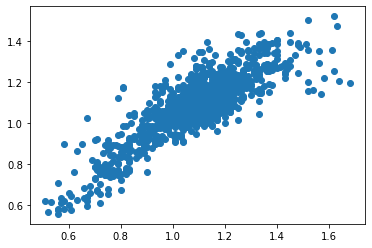

In [533]:
plt.scatter(x=y2_test,y=predict_test)

<AxesSubplot:xlabel='AveragePrice', ylabel='Density'>

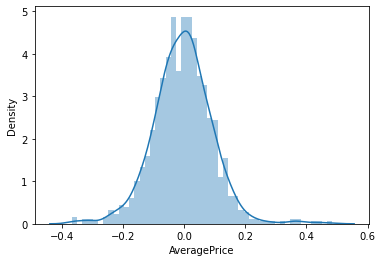

In [534]:
sns.distplot((y2_test-pred),bins=50)

Notice here that our residuals looked to be normally distributed and that's really a good sign which means that our model was a correct choice for the data.

# Hyper Parameter Tuning

Hyper Parameter Tuning for Linear Regression

In [535]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
parameters={'alpha':[.0001,.001,0.1,.1,1,10],'random_state':list(range(0,10))}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 0.0001, 'random_state': 0}


In [536]:
ls=Lasso(alpha=0.0001,random_state=0)
ls.fit(x_train,y_train)
ls.score(x_train,y_train)
pred_decision=ls.predict(x_test)
ls=r2_score(y_test,pred_decision)
print('R2 Score:',ls*100)

R2 Score: 32.39390998924666


Hyper Parameter Tuning for Decision Tree Regressor

In [537]:
from sklearn.model_selection import GridSearchCV
parameters = {'max_depth': np.arange(2, 15)}
GCV=GridSearchCV(DecisionTreeRegressor(),parameters,cv=5)
GCV.fit(x1_train,y1_train)

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])})

In [538]:
GCV.best_params_

{'max_depth': 5}

In [539]:
dtr=DecisionTreeRegressor(max_depth=5,random_state=8)

dtr.fit(x1_train,y1_train)
dtr.score(x1_train,y1_train)
pred_decision=dtr.predict(x1_test)
dtr=r2_score(y1_test,pred_decision)
print('R2 Score:',dtr*100)

R2 Score: 51.440130010639386


Hyper Parameter Tuning for Random Forest Regressor

In [540]:
from sklearn.model_selection import GridSearchCV
parameters={'criterion':['mse','mae'],'max_features':['auto','sqrt','log2']}
rdr=RandomForestRegressor()
clf=GridSearchCV(rdr,parameters)
clf.fit(x2_train,y2_train)
print(clf.best_params_)

{'criterion': 'mse', 'max_features': 'sqrt'}


In [541]:
rdr=RandomForestRegressor(criterion='mse',max_features='auto')
rdr.fit(x2_train,y2_train)
rdr.score(x2_train,y2_train)
pred_decision=rdr.predict(x2_test)
rdr=r2_score(y2_test,pred_decision)
print('R2 Score:',rdr*100)

R2 Score: 72.395390950127


Compare with Actual Final Vs Sample Prediction

,Y2 Test,Prediction
503,1.25,1.1831
368,1.11,1.0513
1071,1.08,1.0682
1027,0.83,0.8969
1322,1.17,1.1676


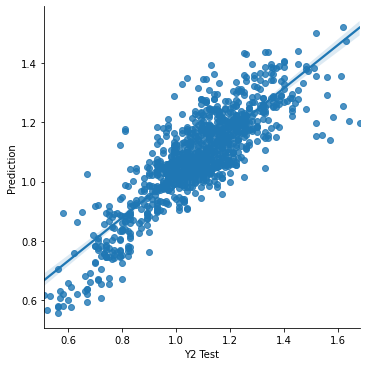

In [542]:
data=pd.DataFrame({'Y2 Test':y2_test , 'Prediction':pred},columns=['Y2 Test','Prediction'])
sns.lmplot(x='Y2 Test',y='Prediction',data=data,palette='rainbow')
data.head()

# Saving the Model

In [543]:
import joblib
joblib.dump(mod,"Avacado Project.csv.pkl")

['Avacado Project.csv.pkl']

# Loading the Saved Model

In [544]:
model=joblib.load("Avacado Project.csv.pkl")
prediction=model.predict(x2_test)
print(r2_score(y2_test,predict_test)*100)

72.43202605417449


In [545]:
prediction=pd.DataFrame(prediction)  # Converting into Data Frame
prediction.to_csv('Result of Avacado project.csv')  
prediction

,0
0,0.993333
1,1.037059
2,1.105738
3,0.686957
4,1.121698
5,1.095854
6,0.942727
7,1.037059
8,1.105738
9,1.105738
